Welcome to Feature Extractor tutorial.

lets start by converting log files to feather files !

In [1]:
%reload_ext autoreload
%autoreload 2


import os
import sys

os.chdir(r'C:\Users\edens\Documents\GitHub\LabCode\build')

cwd = sys.path[0]
print(cwd)
os.chdir(cwd)
if cwd.split('\\')[-1] != 'MolFeatures':
    os.chdir('..')


os.chdir(r'M2_data_extractor')
from data_extractor import Molecules, extract_connectivity
import numpy as np
from feather_extractor import logs_to_feather
from gaussian_handler  import feather_file_handler
os.chdir(r'..\utils')
from help_functions import dict_to_horizontal_df
import pandas as pd
os.chdir(r'..\M3_modeler')
from modeling import ClassificationModel, LinearRegressionModel,fit_and_evaluate_single_combination_regression
os.chdir(r'..')



log_files_path = None #r'C:\Users\edens\Documents\GitHub\LabCode\MolFeatures\Blackwell_logs' #r'C:\Users\edens\Documents\GitHub\LabCode\MolFeatures\new_test' ## example r'C:\Users\edens\Documents\GitHub\lucas_project\Blackwell_logs'
if log_files_path:
    logs_to_feather(log_files_path)

c:\Users\edens\Documents\GitHub\LabCode\MolFeatures


Choose the path to the feather files to load them as Molecules object

In [2]:

# path=r'feather_example'
path=r'C:\Users\edens\Documents\GitHub\LabCode\MolFeatures\feather_example'
mols=Molecules(path)



Molecules Loaded: ['basic.feather', 'm_Br.feather', 'm_Cl.feather', 'm_F.feather', 'm_I.feather', 'm_nitro.feather', 'o_Br.feather', 'o_Cl.feather', 'o_F.feather', 'o_I.feather', 'o_nitro.feather', 'penta_F.feather', 'p_amine.feather', 'p_azide.feather', 'p_boc.feather', 'p_Br.feather', 'p_Cl.feather', 'p_F.feather', 'p_I.feather', 'p_Me.feather', 'p_nitro.feather', 'p_OEt.feather', 'p_OH.feather', 'p_OMe.feather', 'p_Ph.feather', 'p_tfm.feather'] Failed Molecules: []


In [3]:
mols.molecules[0].vibration_dict


{'vibration_atom_1': array([[ 0.  ,  0.06, -0.04],
        [ 0.01,  0.03,  0.06],
        [ 0.  , -0.09, -0.03],
        [-0.04, -0.02, -0.05],
        [-0.04,  0.03, -0.05],
        [ 0.02,  0.14, -0.03],
        [ 0.  ,  0.04,  0.03],
        [-0.03,  0.08,  0.12],
        [-0.02, -0.03, -0.01],
        [ 0.03, -0.01, -0.02],
        [ 0.07,  0.16, -0.16],
        [ 0.26, -0.08, -0.08],
        [ 0.  ,  0.  , -0.01],
        [-0.07,  0.  , -0.04],
        [-0.01,  0.04,  0.01],
        [ 0.02,  0.06, -0.04],
        [-0.05,  0.06, -0.1 ],
        [ 0.04,  0.15, -0.02],
        [ 0.02, -0.08,  0.12],
        [-0.03,  0.05, -0.03],
        [-0.05,  0.2 , -0.08],
        [ 0.05, -0.09,  0.06],
        [-0.08,  0.06, -0.08],
        [ 0.02, -0.02,  0.02],
        [-0.03,  0.  ,  0.  ],
        [ 0.05, -0.04,  0.07],
        [ 0.03, -0.01, -0.02],
        [ 0.  , -0.06,  0.03],
        [ 0.04, -0.03, -0.01],
        [ 0.  ,  0.01,  0.  ],
        [-0.04,  0.11, -0.07],
        [ 0.07,  0.

In [4]:
mols.visualize_molecules(indices=[0])

{frozenset({0, 1}): 1.36, frozenset({3, 4}): 1.09, frozenset({6, 7}): 1.39, frozenset({18, 19}): 1.53, frozenset({26, 27}): 1.34, frozenset({0, 2}): 1.21, frozenset({3, 5}): 1.09, frozenset({8, 6}): 1.4, frozenset({9, 7}): 1.39, frozenset({11, 13}): 1.39, frozenset({18, 20}): 1.09, frozenset({19, 21}): 1.53, frozenset({26, 28}): 1.19, frozenset({0, 3}): 1.52, frozenset({3, 6}): 1.51, frozenset({10, 7}): 1.08, frozenset({8, 11}): 1.39, frozenset({16, 13}): 1.08, frozenset({19, 22}): 1.09, frozenset({24, 21}): 1.09, frozenset({8, 12}): 1.09, frozenset({9, 13}): 1.39, frozenset({11, 15}): 1.08, frozenset({19, 23}): 1.09, frozenset({25, 21}): 1.09, frozenset({9, 14}): 1.08, frozenset({27, 21}): 1.44, frozenset({18, 26}): 1.54, frozenset({1, 18}): 1.44, frozenset({17, 1}): 1.01}


lets print what this class can do

In [12]:
methods=[method for method in dir(mols) if not method.startswith('_')]
print(methods)

['extract_all_dfs', 'extract_all_xyz', 'failed_molecules', 'filter_molecules', 'get_bend_vibration_dict', 'get_bond_angle_dict', 'get_bond_length_dict', 'get_charge_df_dict', 'get_charge_diff_df_dict', 'get_dipole_dict', 'get_molecules_comp_set_app', 'get_npa_dict', 'get_ring_vibration_dict', 'get_sterimol_dict', 'get_stretch_vibration_dict', 'molecules', 'molecules_names', 'molecules_path', 'old_molecules', 'old_molecules_names', 'visualize_molecules', 'visualize_smallest_molecule', 'visualize_smallest_molecule_morfeus']


In [4]:
ring_dict=mols.get_ring_vibration_dict([7,14])
ring_dict

product: [0.032600000000000004, 0.04320000000000001, 0.0646, 0.039, 0.06690000000000002, 0.0006000000000000001, 0.0007000000000000001, 0.0237, 0.05790000000000001, 0.0168, 0.0165, 0.1316, 0.00019999999999999993, 0.0028, 0.0062, 0.0004000000000000001, 0.0007000000000000009, 0.0018000000000000008, -0.0182, -0.07880000000000001, -0.019899999999999994, -0.010300000000000002, -0.04680000000000001, -0.0761, -0.0285, -0.0292, -0.0030000000000000005, -0.0094, -0.0002999999999999999, 4.0657581468206416e-20, 9.999999999999994e-05, -0.004, -0.010600000000000002, 0.0, -0.003100000000000001, -0.006400000000000001, -0.018000000000000002, -0.019100000000000002, 0.0006000000000000001, 0.0, 2.168404344971009e-19, 0.0, -0.0012, -0.0021, -0.0019, -0.005299999999999999, -0.0033, 0.0, 0.010600000000000002, 0.0, -0.0007000000000000001, -0.0001, 0.0006999999999999997, 0.0, 0.0025000000000000005, -0.0006000000000000001, 0.0, 0.0, -0.0001, 0.0, 0.0036000000000000003, 0.0, 0.0010000000000000002, 0.0001, -0.5752

{'basic':                        0
 cross        1680.271800
 cross_angle     1.223058
 para         1657.144500
 para_angle     87.969857,
 'm_Br':                        0
 cross        1669.349800
 cross_angle     2.207836
 para         1641.563100
 para_angle     85.572582,
 'm_Cl':                        0
 cross        1672.189800
 cross_angle     2.659190
 para         1647.622600
 para_angle     89.831746,
 'm_F':                        0
 cross        1687.474900
 cross_angle     0.280424
 para         1667.799200
 para_angle     88.648865,
 'm_I':                        0
 cross        1665.187600
 cross_angle     2.978579
 para         1635.908300
 para_angle     84.474147,
 'm_nitro':                        0
 cross        1670.161400
 cross_angle    17.675709
 para         1652.892800
 para_angle     89.823891,
 'o_Br':                        0
 cross        1667.603200
 cross_angle     2.255447
 para         1640.950300
 para_angle     83.116147,
 'o_Cl':                 

In [6]:
bend_dict=mols.get_bend_vibration_dict([5,6])
bend_dict

Error: could not calculate bend vibration for basic 
Error: could not calculate bend vibration for m_Br 
Error: could not calculate bend vibration for m_Cl 
Error: could not calculate bend vibration for m_F 
Error: could not calculate bend vibration for m_I 
Error: could not calculate bend vibration for m_nitro 
Error: could not calculate bend vibration for o_Br 
Error: could not calculate bend vibration for o_Cl 
Error: could not calculate bend vibration for o_F 
Error: could not calculate bend vibration for o_I 
Error: could not calculate bend vibration for o_nitro 
Error: could not calculate bend vibration for penta_F 
Error: could not calculate bend vibration for p_amine 
Error: could not calculate bend vibration for p_azide 
Error: could not calculate bend vibration for p_boc 
Error: could not calculate bend vibration for p_Br 
Error: could not calculate bend vibration for p_Cl 
Error: could not calculate bend vibration for p_F 
Error: could not calculate bend vibration for p_I 
E

{}

In [10]:
stretch_dict=mols.get_stretch_vibration_dict([16,21])
stretch_dict

Error: the following bonds do not exist-check atom numbering in molecule: 
 SM362 



{'SM362':               Frequency Amplitude
 Stretch_16_21       NaN       NaN,
 'SM374':                Frequency  Amplitude
 Stretch_16_21  3006.5171   0.107393}

In [8]:

mols.get_stretch_vibration_dict([27,29],1300)

Error: the following bonds do not exist-check atom numbering in molecule: 
 SM362 

Error: the following bonds do not exist-check atom numbering in molecule: 
 SM374 



{'SM362':               Frequency Amplitude
 Stretch_27_29       NaN       NaN,
 'SM374':               Frequency Amplitude
 Stretch_27_29       NaN       NaN}

In [ ]:
mols.get_stretch_vibration_dict([19,21],1000)

In [ ]:
mols.get_stretch_vibration_dict([1,4],1000)

In [ ]:
### entering the origin indices as a list will take the center of those coordinates
dipole_indices=[[7,8,9,10,14,12],8,9]
dipole=mols.get_dipole_dict(dipole_indices)
dipole


In [5]:

# Example usage of get_sterimol_dict
atom_indices = [2,4]  # Example atom indices
sterimol_dict = mols.get_sterimol_dict(atom_indices)
sterimol_dict


{'basic':        B1    B5     L  loc_B1  loc_B5
 2-4  2.08  6.38  4.49    2.83    2.35,
 'm_Br':       B1    B5     L  loc_B1  loc_B5
 2-4  2.0  6.38  4.62    2.83    2.55,
 'm_Cl':        B1   B5    L  loc_B1  loc_B5
 2-4  2.01  6.9  5.3    2.83     3.5,
 'm_F':        B1    B5     L  loc_B1  loc_B5
 2-4  2.02  6.39  4.73    2.83    2.54,
 'm_I':        B1    B5     L  loc_B1  loc_B5
 2-4  2.03  6.38  4.56    2.83    2.46,
 'm_nitro':        B1    B5     L  loc_B1  loc_B5
 2-4  1.91  7.25  5.37    2.83    3.74,
 'o_Br':        B1    B5     L  loc_B1  loc_B5
 2-4  1.83  6.33  5.52    2.83    3.31,
 'o_Cl':        B1    B5     L  loc_B1  loc_B5
 2-4  1.83  6.33  6.24    2.83    3.31,
 'o_F':        B1    B5     L  loc_B1  loc_B5
 2-4  1.98  6.39  4.95    2.83    2.71,
 'o_I':        B1    B5     L  loc_B1  loc_B5
 2-4  1.81  6.32  5.59    2.83    3.37,
 'o_nitro':        B1    B5     L  loc_B1  loc_B5
 2-4  1.69  6.27  5.17    2.82    3.67,
 'penta_F':        B1    B5     L  loc_B1  loc

In [12]:
atom_indices = [1, 2, 3]  # Example base atom indices

npa_dict = mols.get_npa_dict(atom_indices)
npa_dict

{'basic':               dip_x     dip_y     dip_z  total_dipole
 NPA_1-2-3 -0.555802  1.063248  0.958814      1.535818,
 'm_Br':               dip_x     dip_y     dip_z  total_dipole
 NPA_1-2-3 -0.327385  1.029515  0.882973       1.39525,
 'm_Cl':               dip_x     dip_y     dip_z  total_dipole
 NPA_1-2-3 -0.265805  1.011966  0.851532      1.349013,
 'm_F':               dip_x    dip_y     dip_z  total_dipole
 NPA_1-2-3  0.042899  0.93595  0.703408      1.171591,
 'm_I':              dip_x     dip_y     dip_z  total_dipole
 NPA_1-2-3 -0.47994  1.069215  0.943099      1.504327,
 'm_nitro':               dip_x     dip_y     dip_z  total_dipole
 NPA_1-2-3  0.675659  0.849236  0.696292      1.289395,
 'o_Br':               dip_x     dip_y     dip_z  total_dipole
 NPA_1-2-3 -0.523566  1.121141  0.881016      1.518969,
 'o_Cl':               dip_x     dip_y     dip_z  total_dipole
 NPA_1-2-3 -0.488019  1.139119  0.812253      1.481726,
 'o_F':               dip_x     dip_y     dip_z  t

In [ ]:
ring_atom_indices = [7,14]  # Example ring atom indices
ring_vibration_dict = mols.get_ring_vibration_dict(ring_atom_indices)
ring_vibration_dict

In [ ]:
atom_indices = [[1, 2, 3], [4, 5, 6]]    
bond_angle_dict = mols.get_bond_angle_dict(atom_indices)
bond_angle_dict

In [14]:
atom_pairs = [[1, 2], [3, 4]]  # Example atom pairs
bond_length_dict = mols.get_bond_length_dict(atom_pairs)
bond_length_dict

{'basic':                         0
 bond_length_1-2  1.364849
 bond_length_3-4  2.395374,
 'm_Br':                         0
 bond_length_1-2  1.365923
 bond_length_3-4  2.397796,
 'm_Cl':                         0
 bond_length_1-2  1.365894
 bond_length_3-4  2.397590,
 'm_F':                         0
 bond_length_1-2  1.365793
 bond_length_3-4  2.396679,
 'm_I':                         0
 bond_length_1-2  1.365452
 bond_length_3-4  2.396980,
 'm_nitro':                         0
 bond_length_1-2  1.366116
 bond_length_3-4  2.400265,
 'o_Br':                         0
 bond_length_1-2  1.366818
 bond_length_3-4  2.403994,
 'o_Cl':                         0
 bond_length_1-2  1.366904
 bond_length_3-4  2.403536,
 'o_F':                         0
 bond_length_1-2  1.366530
 bond_length_3-4  2.398323,
 'o_I':                         0
 bond_length_1-2  1.366672
 bond_length_3-4  2.404349,
 'o_nitro':                         0
 bond_length_1-2  1.357154
 bond_length_3-4  2.396848,
 'penta

In [ ]:
atom_indices = [[1, 2], [3, 4]] 
charge_diff_df_dict = mols.get_charge_diff_df_dict(atom_indices,tyep='nbo')
charge_diff_df_dict

In [ ]:
### Help function to unify all dictionaries into one dataframe for this nobeook example

lists_in_scope = {k: v for k, v in globals().items() if isinstance(v, dict)}
def unify_list_of_dicts_to_dataframe(list_of_dicts):
    """
    Unify two dictionaries into one dictionary.
    """ 
    data = pd.DataFrame()
    for key, value in lists_in_scope.items():
        for key, value1 in value.items():
            try:
                data = pd.concat([data, dict_to_horizontal_df(value1)], axis=1)
            except AttributeError:
                if isinstance(value1, dict):
                    for key2, value2 in value1.items():
                        try:
                        
                            data = pd.concat([data, dict_to_horizontal_df(value2)], axis=1)
                            
                        except Exception as e:  # Catch any exception and print the error for debugging
                            continue
            except Exception as e:  # Catch any other exceptions for the outer loop
                print(f"Error processing value1: {e}")
    return data

data = unify_list_of_dicts_to_dataframe(lists_in_scope)

csv_name=None  ## change to save the dataframe to a csv file

if csv_name:
    data.to_csv(csv_name)

print(data)

Now that we produces a csv with features we can save it and use the modeler (y values needs to be manually added)

Calculating combinations with threshold 0.85: 100%|██████████| 82954/82954 [01:11<00:00, 1162.63it/s]


All Q2 values are -inf, recalculating with a new R2 threshold...
0.7333641844807981
new threshold 0.5833641844807981


Calculating combinations with threshold 0.5833641844807981: 100%|██████████| 82954/82954 [01:14<00:00, 1118.66it/s]


| formula                                                             |       R.sq |          Q.sq |         MAE |   Model_id |
|:--------------------------------------------------------------------|-----------:|--------------:|------------:|-----------:|
| ('NPA_1', 'NPA_6', 'diff_NBO_4_10', '-7-30-')                       | 0.696614   |    0.546069   |    0.641198 |          0 |
| ('NPA_6', 'diff_NBO_10_42', 'Dist(3, 9)', 'loc.B5_3_9')             | 0.680476   |    0.535573   |    0.662312 |          1 |
| ('NPA_4', 'NPA_6', 'diff_NBO_10_42', 'dip_y_1')                     | 0.672185   |    0.535307   |    0.653195 |          2 |
| ('NPA_1', 'NPA_6', 'diff_NBO_4_10', 'diff_NBO_10_42')               | 0.690997   |    0.534993   |    0.674324 |          3 |
| ('NPA_6', 'diff_NBO_4_10', 'diff_NBO_10_42', 'dip_y_1')             | 0.645891   |    0.532612   |    0.664178 |          4 |
| ('dip_x_1', '-7-30-', 'Dist(4, 10)', 'Dist(32, 30)')                | 0.709989   |    0.52631    |    

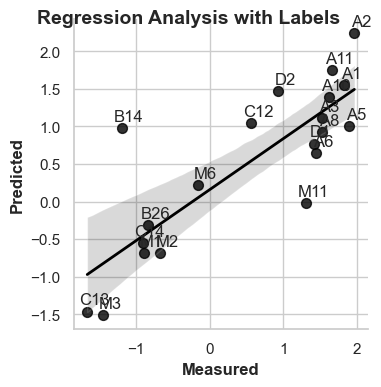

In [9]:
csv_path=   r'C:\Users\edens\Documents\GitHub\LabCode\MolFeatures\modeling_example\inbal_test.csv'


csv_filepaths = {
'features_csv_filepath': csv_path,
'target_csv_filepath': ''
}

Regression_model = LinearRegressionModel(csv_filepaths, process_method='one csv', output_name='output', leave_out=None, min_features_num=2, max_features_num=None, metrics=None, return_coefficients=False)
results=Regression_model.fit_and_evaluate_combinations(top_n=None)

You can also choose a combination and manually run it 

In [15]:
Regression_model.features_df.columns

Index(['NPA_1', 'NPA_2', 'NPA_3', 'NPA_4', 'NPA_5', 'NPA_6', 'NPA_7', 'NPA_9',
       'NPA_10', 'NPA_30', 'NPA_31', 'NPA_32', 'NPA_42', 'NPA_43',
       'diff_NBO_4_10', 'diff_NBO_3_9', 'diff_NBO_10_42', 'dip_x_1', 'dip_y_1',
       'dip_z_1', 'Total_1', '-7-30-', 'Dist(4, 10)', 'Dist(3, 9)',
       'Dist(10, 42)', 'Dist(32, 30)', 'Iso.Polar', 'Aniso.Polar', 'B1_3_9',
       'B5_3_9', 'L_3_9', 'loc.B5_3_9', 'loc.B1_3_9', 'B1_9_3', 'B5_9_3',
       'L_9_3', 'loc.B5_9_3', 'loc.B1_9_3'],
      dtype='object')

In [18]:
fit_and_evaluate_single_combination_regression(Regression_model,['loc.B5_9_3', 'loc.B1_9_3'],r2_threshold=0)

({'combination': ['loc.B5_9_3', 'loc.B1_9_3'],
  'scores': {'r2': 0.06720594580751815,
   'Q2': -0.19919571523234403,
   'MAE': 1.2875583545347973},
  'intercept': array([-0.11428768,  0.36250006]),
  'coefficients': 0.49492241888879074,
  'models': <modeling.LinearRegressionModel at 0x13d820efdc0>},
 0.0006325244903564453,
 0.0,
 0.005875349044799805)

[autoreload of plot failed: Traceback (most recent call last):
  File "c:\Users\edens\anaconda3\envs\labenv\lib\site-packages\IPython\extensions\autoreload.py", line 273, in check
    superreload(m, reload, self.old_objects)
  File "c:\Users\edens\anaconda3\envs\labenv\lib\site-packages\IPython\extensions\autoreload.py", line 471, in superreload
    module = reload(module)
  File "c:\Users\edens\anaconda3\envs\labenv\lib\importlib\__init__.py", line 168, in reload
    raise ModuleNotFoundError(f"spec not found for the module {name!r}", name=name)
ModuleNotFoundError: spec not found for the module 'plot'
]
Calculating combinations: 100%|██████████| 4/4 [00:00<00:00, 40.43it/s]


| formula                    |   accuracy |   precision |   recall |       f1 |   avg_accuracy |      avg_f1 |   Model_id |
|:---------------------------|-----------:|------------:|---------:|---------:|---------------:|------------:|-----------:|
| ('flag', '-2-3-')          |   0.927273 |    0.931818 | 0.927273 | 0.927988 |       0.909091 |    0.905952 |          0 |
| ('flag', '-2-3-', '-2-7-') |   0.945455 |    0.947036 | 0.945455 | 0.945849 |       0.909091 |    0.90624  |          1 |
| ('flag', '-2-7-')          |   0.963636 |    0.965152 | 0.963636 | 0.96382  |       0.890909 |    0.871515 |          2 |
| ('-2-3-', '-2-7-')         |   0.672727 |    0.670256 | 0.672727 | 0.667619 |    -inf        | -inf        |          3 |


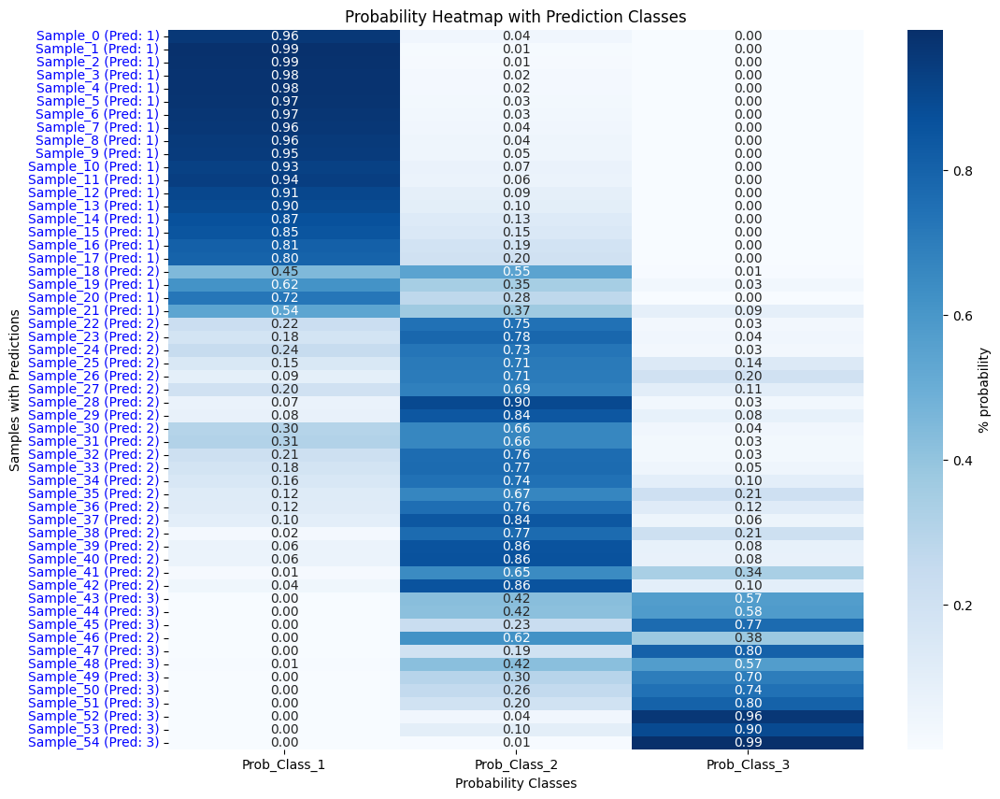


Confusion Matrix

['100.0%', '91.3%', '90.9%']
        0   1   2
Total  21  23  11


ValueError: `data` and `annot` must have same shape.

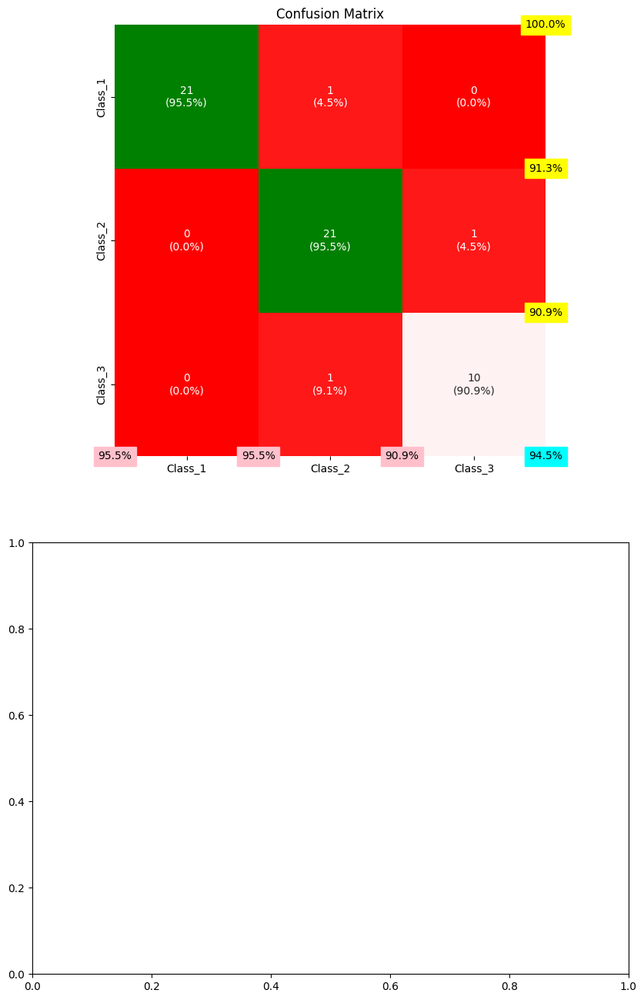

In [17]:
## Classification example still needs visualization improvement

csv_path=  r'C:\Users\edens\Documents\GitHub\LabCode\MolFeatures\modeling_example\Logistic_Dataset_Example.csv'


csv_filepaths = {
'features_csv_filepath': csv_path,
'target_csv_filepath': ''
}
classification=ClassificationModel(csv_filepaths, process_method='one csv', output_name='class', leave_out=None, min_features_num=2, max_features_num=None,  metrics=None, return_coefficients=False)
classification_results=classification.fit_and_evaluate_combinations(top_n=20)

In [3]:
import os
os.chdir(r'C:\Users\edens\Downloads')
import pandas as pd
df=pd.read_feather('penta_F.feather')
## show all pd columns
pd.set_option('display.max_columns', None)

In [4]:
dict_l=feather_file_handler('penta_F.feather')

xyz:      0          1          2          3
0   38                                 
1                                      
2    C   1.196783  -1.057553  -0.773789
3    N   1.107492  -0.591699   0.486854
4    O   2.246163  -1.095182  -1.392717
5    C   -0.08599  -1.590307  -1.402157
6    H   0.022593  -1.435581  -2.474472
7    H  -0.113188  -2.665404  -1.223189
8    C  -1.343657  -0.950492  -0.894157
9    C  -2.249363  -1.611387  -0.081111
10   C  -1.619661   0.374695  -1.193479
11   C  -3.385644  -0.991943   0.409849
12   F  -2.032435  -2.881431   0.257781
13   C  -2.738163   1.021956  -0.709671
14   F  -0.773628   1.055378  -1.964758
15   C  -3.627587   0.332864   0.096338
16   F  -4.229427  -1.651407   1.191544
17   F  -2.949775   2.304169  -0.992447
18   F  -4.697165   0.945546   0.578696
19   H   0.211342  -0.489326   0.951078
20   C   2.247592  -0.025273   1.153995
21   C   3.421747  -0.953802   1.458283
22   H   1.872445   0.443372   2.068174
23   C   4.609846   0.004013   1.41

In [5]:
dict_l

[{'standard_orientation_df':    atom         x         y         z
  0     C  1.196783 -1.057553 -0.773789
  1     N  1.107492 -0.591699  0.486854
  2     O  2.246163 -1.095182 -1.392717
  3     C -0.085990 -1.590307 -1.402157
  4     H  0.022593 -1.435581 -2.474472
  5     H -0.113188 -2.665404 -1.223189
  6     C -1.343657 -0.950492 -0.894157
  7     C -2.249363 -1.611387 -0.081111
  8     C -1.619661  0.374695 -1.193479
  9     C -3.385644 -0.991943  0.409849
  10    F -2.032435 -2.881431  0.257781
  11    C -2.738163  1.021956 -0.709671
  12    F -0.773628  1.055378 -1.964758
  13    C -3.627587  0.332864  0.096338
  14    F -4.229427 -1.651407  1.191544
  15    F -2.949775  2.304169 -0.992447
  16    F -4.697165  0.945546  0.578696
  17    H  0.211342 -0.489326  0.951078
  18    C  2.247592 -0.025273  1.153995
  19    C  3.421747 -0.953802  1.458283
  20    H  1.872445  0.443372  2.068174
  21    C  4.609846  0.004013  1.412673
  22    H  3.516940 -1.699013  0.671951
  23    H  3.

In [ ]:
#!/gpfs0/gaus/users/edenspec/.conda/envs/working_env/bin/python
import re
import pandas as pd
import numpy as np
import os
from enum import Enum
from typing import List, Optional
import re
import pandas as pd

class ReExpressions(Enum):
    FLOAT = r'[-+]?[0-9]*\.?[0-9]+'
    # FLOAT= r'-?\d*\.\d*'
    FLOATS_ONLY= "[-+]?[.]?[\d]+(?:,\d\d\d)*[\.]?\d*(?:[eE][-+]?\d+)?"
    BONDS= r'R\(\d+.\d+'
    FREQUENCY= r'\-{19}'
    CHARGES=r'^-?[0-9]+([.][0-9]+)?$'

class FileFlags(Enum):
    DIPOLE_START='Dipole moment'
    DIPOLE_END='Quadrupole moment'
    MAIN_CUTOFF= r'\-{69}'
    STANDARD_ORIENTATION_START='Standard orientation:'
    POL_START='iso'
    POL_END='xx'
    CHARGE_START='Summary of'
    CHARGE_END='====='
    FREQUENCY_START='Harmonic frequencies'
    FREQUENCY_END='Thermochemistry'
    MULIKEN_START='Mulliken charges:'
    MULIKEN_END='Sum of Mulliken'

class Names(Enum):
    
    DIPOLE_COLUMNS=['dip_x','dip_y','dip_z','total_dipole']
    STANDARD_ORIENTATION_COLUMNS=['atom','x','y','z']
    DF_LIST=['standard_orientation_df', 'dipole_df', 'pol_df', 'atype_df','charge_df', 'bonds_df', 'info_df','energy_value']


class GeneralConstants(Enum):    
    ATOMIC_NUMBERS ={
     '1':'H', '5':'B', '6':'C', '7':'N', '8':'O', '9':'F', '14':'Si',
              '15':'P', '16':'S', '17':'Cl', '35':'Br', '53':'I', '27':'Co', '28':'Ni','46':'Pd', '78':'Pt'}
     

    


def search_phrase_in_text(text_lines: str, key_phrase: str) : 
        """
        Searches for a key phrase in a list of text lines.
        
        Parameters:
            text_lines: text string to search through.
            key_phrase: The phrase to search for.
            
        Returns:
            The index of the first line where the key phrase is found, or None if not found.
        """   
        search_result=re.compile(key_phrase).search(text_lines)
        # print(f"Found key phrase '{key_phrase}' at line {search_result.start()}") if search_result else print(f"Key phrase '{key_phrase}' not found")
        return search_result

def extract_lines_from_text(text_lines, re_expression):
    selected_lines=re.findall(re_expression, text_lines)
    # if strip:
    #     selected_lines=selected_lines.strip()
    return selected_lines



def process_gaussian_charge_text(log_file_lines):
    charges_start =search_phrase_in_text(log_file_lines, key_phrase=FileFlags.CHARGE_START.value)
    charges_end = search_phrase_in_text(log_file_lines, key_phrase=FileFlags.CHARGE_END.value)
    selected_lines = (extract_lines_from_text(log_file_lines[charges_start.start():charges_end.start()],
                                             re_expression=ReExpressions.FLOATS_ONLY.value))
    charge_array = np.array(selected_lines)
    charge_array=charge_array[1::6]
    return pd.DataFrame(charge_array, columns=['charge'])

def find_all_matches(log_file_lines, key_phrase):
    return [match for match in re.finditer(key_phrase, log_file_lines)]

def process_gaussian_dipole_text(log_file_lines):
    # Find all occurrences of the start and end markers
    dipole_starts = find_all_matches(log_file_lines, FileFlags.DIPOLE_START.value)
    dipole_ends = find_all_matches(log_file_lines, FileFlags.DIPOLE_END.value)

    if dipole_starts and dipole_ends:
        last_dipole_start = dipole_starts[-1].end()
        last_dipole_end = dipole_ends[-1].start()
        text_section = log_file_lines[last_dipole_start:last_dipole_end]
        selected_lines = extract_lines_from_text(text_section, re_expression=ReExpressions.FLOAT.value)
        selected_lines = selected_lines[0:4] 
        dipole_df = pd.DataFrame(selected_lines, index=Names.DIPOLE_COLUMNS.value).T
        
        return dipole_df

def process_muliken_charges(log_file_lines):

    muliken_start = find_all_matches(log_file_lines, FileFlags.MULIKEN_START.value)
    muliken_end = find_all_matches(log_file_lines, FileFlags.MULIKEN_END.value)
    if muliken_start and muliken_end:
        
        last_muliken_start = muliken_start[-1].end()
        last_muliken_end = muliken_end[-1].start()
        
        text_section = log_file_lines[last_muliken_start:last_muliken_end]
        
        charges_re = re.findall(r'-?\d+\.\d+', text_section)
        
        charges_float = [float(charge) for charge in charges_re]
        
        charge_df = pd.DataFrame(charges_float, columns=['charge'])
       
        return charge_df
        

def gauss_first_split(log_file_lines):
    first_split=re.split(FileFlags.STANDARD_ORIENTATION_START.value,log_file_lines)[-1]
    gauss_data=re.split(FileFlags.MAIN_CUTOFF.value,first_split)
    return gauss_data

def process_gaussian_standard_orientation_text(log_file_lines):

    standard_orientation_lines=(extract_lines_from_text(log_file_lines, ReExpressions.FLOATS_ONLY.value ))
    standard_orientation=np.array(standard_orientation_lines).reshape(-1,6)
    
    standard_orientation=np.delete(standard_orientation,(0,2),1)
    standard_orientation_df=pd.DataFrame(standard_orientation,columns=Names.STANDARD_ORIENTATION_COLUMNS.value)
    
    standard_orientation_df.replace({'atom': GeneralConstants.ATOMIC_NUMBERS.value}, inplace=True)
    # standard_orientation_df[['x', 'y', 'z']] = standard_orientation_df[['x', 'y', 'z']].astype(float)
    ## add 2 columns on top and add the .shape[0] to the first row 'atom' column
    # Create a new DataFrame with two rows
    new_rows = pd.DataFrame(np.nan, index=[0, 1], columns=standard_orientation_df.columns)
    # Set the 'atom' column in the first row to the number of rows in df
    new_rows.loc[0, 'atom'] = standard_orientation_df.shape[0]
    # Concatenate the new rows with df
    
    df = pd.concat([new_rows, standard_orientation_df], ignore_index=True)

    return df

# def process_gaussian_pol(log_file_lines):
#     pol_start=search_phrase_in_text(log_file_lines, key_phrase=FileFlags.POL_START.value)
#     pol_end=search_phrase_in_text(log_file_lines, key_phrase=FileFlags.POL_END.value)
#     pol=extract_lines_from_text(log_file_lines[pol_start.start():pol_end.start()], re_expression=ReExpressions.FLOAT.value)
#     pol_df=pd.DataFrame([float(pol[0])*1000,float(pol[3])*1000],index=['iso','aniso'],dtype=float)
#     return pol_df

def search_phrase_in_text_pol(text: str, key_phrase: str) -> int:
    """
    Search for a key phrase in a text string and return the start position of the match.

    Parameters:
        text (str): The text to search within.
        key_phrase (str): The phrase to search for.

    Returns:
        int: The start index of the first match or None if not found.
    """
    pattern = re.compile(rf"{re.escape(str(key_phrase))}\s")
    match = pattern.search(text)
    if match:
        return match.start()
    return None

def process_gaussian_pol_text(log_file_lines: List[str]) -> Optional[pd.DataFrame]:
    """
    Processes Gaussian polarization data and returns a DataFrame.
    
    Parameters:
        log_file_lines: List of lines from the Gaussian log file.
        
    Returns:
        A DataFrame containing polarization data or None if not found.
    """
    # If log_file_lines is a list, convert it to a single string
    if isinstance(log_file_lines, list):
        log_file_text = '\n'.join(log_file_lines)
    else:
        log_file_text = log_file_lines

    pol_start = search_phrase_in_text_pol(log_file_text, key_phrase=FileFlags.POL_START.value)
    pol_end = search_phrase_in_text_pol(log_file_text, key_phrase=FileFlags.POL_END.value)
    
    if pol_start is not None and pol_end is not None:
        pol = extract_lines_from_text(log_file_lines[pol_start:pol_end], re_expression=ReExpressions.FLOAT.value)
        pol_df = pd.DataFrame([float(pol[0])*1000, float(pol[6])*1000], index=['iso', 'aniso'], dtype=str).T
        return pol_df
    else:
        # print("Failed to create.")
        pol_df = pd.DataFrame([100, 100], index=['iso', 'aniso'], dtype=str).T
        return pol_df




def process_gaussian_bonds(log_file_lines):
    bonds=extract_lines_from_text(log_file_lines, re_expression=ReExpressions.BONDS.value)
    bonds_text=[re.sub(r'R\(','',line).split(',') for line in bonds]
    return bonds_text



def remove_floats_until_first_int(input_list):
    output_list = []
    encountered_integer = False
    for item in input_list:
        try:
            # Try converting the string to an integer
            int_item = int(item)
            encountered_integer = True
            output_list.append(item)
        except ValueError:
            # If conversion to integer fails, try float
            try:
                float_item = float(item)
                if encountered_integer:
                    output_list.append(item)
            except ValueError:
                # If conversion to both integer and float fails, keep the item
                output_list.append(item)
    return output_list
def parse_dipole_and_polarizability(data):
    # Adjusted regex pattern

    dipole_pattern = re.compile(r'VibFq2-Diag2([\s\S]*?)Diagonal vibrational')
    match = dipole_pattern.findall(data)[0]
    
    pattern = re.compile(
        r':\s+N=\s+\d+\s+IV=\s+\d+\s+MDV=\s+\d+\s+NE2=\s+\d+([\s\S]*?)(?=:\s+N=|\Z)',
        re.MULTILINE
    )
    
    matches = pattern.findall(match)
   
    
    if not matches:
        raise ValueError("No dipole and polarizability data found in the input.")
    
    # Use a set to track unique blocks
    unique_blocks = set()
    
    dipole_derivatives = []
    polarizability_contributions = []
    
    for block in matches:
        block = block.strip()
        
        # Skip if this block has already been processed
        if block in unique_blocks:
            continue
        unique_blocks.add(block)
        
        # Process each line in the block
        lines = block.splitlines()
        for line in lines:
            line = line.strip()
            # Extract dipole derivative values
            if line.startswith("Dipole derivative"):
                dipole_values = line.split(":")[1].strip().split()
                dipole_derivatives.append([float(v.replace("D", "E")) for v in dipole_values])
            # Extract vibrational polarizability contributions
            elif line.startswith("Vibrational polarizability contributions from mode"):
                polarizability_values = line.split()[-3:]
                polarizability_contributions.append([float(v.replace("D", "E")) for v in polarizability_values])
    
    # Convert lists to DataFrames and remove duplicates
    dipole_derivatives_df = pd.DataFrame(dipole_derivatives, columns=['X', 'Y', 'Z']).drop_duplicates().reset_index(drop=True)
    polarizability_contributions_df = pd.DataFrame(polarizability_contributions, columns=['Alpha_X', 'Alpha_Y', 'Alpha_Z']).drop_duplicates().reset_index(drop=True)
    
    
    return dipole_derivatives_df, polarizability_contributions_df

# def parse_dipole_and_polarizability(data):
#     # Regex to extract the relevant section
#     dipole_pattern = re.compile(r'VibFq2-Diag2([\s\S]*?)Diagonal vibrational')
#     match = dipole_pattern.findall(data)[0]
    
#     if not match:
#         raise ValueError("No dipole and polarizability data found in the input.")
   
#     relevant_section = match  # Extract the matched section
    
#     dipole_derivatives = []
#     polarizability_contributions = []

#     # Process each line of the extracted section
#     lines = relevant_section.splitlines()
#     for i, line in enumerate(lines):
#         line = line.strip()
#         # Extract dipole derivative values
#         if line.startswith("Dipole derivative"):
#             dipole_values = line.split(":")[1].strip().split()
#             dipole_derivatives.append([float(v.replace("D", "E")) for v in dipole_values])
           
#         # Extract vibrational polarizability contributions
#         elif line.startswith("Vibrational polarizability contributions from mode"):
#             polarizability_values = line.split()[-3:]
#             polarizability_contributions.append([float(v.replace("D", "E")) for v in polarizability_values])

#     # Convert to numpy arrays
#     dipole_derivatives = pd.DataFrame(dipole_derivatives).drop_duplicates()
#     polarizability_contributions = pd.DataFrame(polarizability_contributions).drop_duplicates()
#     print( dipole_derivatives[0])
#     return dipole_derivatives, polarizability_contributions

def process_gaussian_vibs_string(log_file_lines):
    pattern = re.compile(rf'{FileFlags.FREQUENCY_START.value}([\s\S]*?){FileFlags.FREQUENCY_END.value}')
    match = pattern.search(log_file_lines)
    if match:
        vibration_section = match.group(1).strip()

        # Further slicing the obtained text based on 'Frequencies --'
        frequencies_blocks = re.split(r'Frequencies -- ', vibration_section)

        # Removing the last part that contains '------'
        final_blocks = [block.split('-------------------')[0].strip() for block in frequencies_blocks[1:]]

        return final_blocks
    
def process_gaussian_info(frequency_string):
    mass,frc,frequency,ir=[],[],[],[]
    
    for i,data in enumerate(frequency_string):
        
        match=extract_lines_from_text(data, re_expression=ReExpressions.FLOATS_ONLY.value)
        # if i == len(frequency_string) - 1:
        #     frequency.append([match[0]])
        #     frc.append([match[1]])
        #     mass.append([match[2]])
        #     ir.append([match[3]])
        # else:
        frequency.append((match[0:3]))
        frc.append(match[6:9])
        mass.append(match[3:6])
        ir.append(match[9:12])
        
        
    
    info_df=pd.DataFrame()
    info_df['Frequency']=[(item) for sublist in frequency for item in sublist]
    info_df['IR']=[(item) for sublist in ir for item in sublist] 
    info_df['Force']=[(item) for sublist in frc for item in sublist]
    info_df['Mass']=[(item) for sublist in mass for item in sublist]
    
    return info_df

def vib_array_list_to_df(array_list):
    array_list_df=[]

    for arrays in array_list:
        new_df=[]
        for array in arrays:
            new_array=np.delete(array,[0,1]).reshape(-1,3)
            new_df.append(new_array)
        new_df=pd.DataFrame(np.vstack(new_df))
        array_list_df.append(new_df)
    vibs_df=pd.concat(array_list_df,axis=1)
    return vibs_df




def are_first_two_int_strings(values):
    # Convert to string and check if they are digit strings that can be converted to integers
    try:
        # Using int conversion to check; this handles negative and positive integers in string form
        all(isinstance(int(value), int) for value in values[:2])
        return True
    except ValueError:
        # If conversion fails, then not all are integer strings
        return False
    
def process_gaussian_frequency_string(final_blocks):
    vibs_list=[]
    short_list=[]
    lenght=[]
    for i,data in enumerate(final_blocks):
            match=re.findall(ReExpressions.FLOATS_ONLY.value,data)
            # if i == len(final_blocks) - 1:
            #     del match[0:4]
            # else:
            del match[0:12] 
            match=np.array(match)
           ## need to find a way to deal with last match which is not a multiple of 11, planar vibrations
            # match=remove_floats_until_first_int(match)
            match=np.array(match)
            if i==1:
                match=remove_floats_until_first_int(match)
            match=np.array(match)
            lenght.append(len(match))
            try:
                # print(match.reshape(-1,11))
                vibs_list.append(match.reshape(-1,11))  
            except ValueError:   
                    try:
                        match_try=np.delete(match,[-1],0)
                        # print(match_try)
                        vibs_list.append(np.array(match_try).reshape(-1,11))
                    except Exception as e:
                        try: 
                            
                            match_r=np.delete(match,[-1,-2,-3],0)
                            # print(match_r)
                            vibs_list.append(np.array(match_r).reshape(-1,11))
                        except Exception as e:
                            raise ValueError(f"Error processing vibrations: {e}")
                                
    vibs=np.vstack(vibs_list)
    
    np.set_printoptions(threshold=np.inf)
    final_atom=vibs[-1][0]
    ordered_vibs=[]
    for i in range(1,int(final_atom)+1):
        ordered_vibs.append(vibs[vibs[:,0]==str(i)])
    # print(ordered_vibs)
    # ordered_vibs_list=[ordered_vibs[i:i + len(vibs_list)] for i in range(0, len(ordered_vibs), len(vibs_list))]
    # print(ordered_vibs_list)
    vibs_df=vib_array_list_to_df(ordered_vibs) if ordered_vibs else None
    # vibs_df=vib_array_list_to_df_5(ordered_vibs_list,new_arrays) if ordered_vibs_list else None
    
    return vibs_df 


def df_list_to_dict(df_list):
    my_dict={}
    for name,df in zip(Names.DF_LIST.value,df_list):
        my_dict[name]=df
    return my_dict



def process_gaussian_energy_text(energy_string):
    cut=re.split('SCF Done', energy_string)[1]
    energy=extract_lines_from_text(cut, re_expression=ReExpressions.FLOATS_ONLY.value)
    data = np.array([[energy[1]]])
    df = pd.DataFrame(data, columns=['energy'])

    return df

def gauss_file_handler(gauss_filename, export=False):
    string_report=''
    with open(os.path.abspath(gauss_filename)) as f:
        log_file_lines = f.read()

    try:
        energy_df = process_gaussian_energy_text(log_file_lines)
    except IndexError:
        energy_df = pd.DataFrame()
        print("{gauss_filename}: Error processing energy.")
        string_report+="{gauss_filename}: Error processing energy.\n"

    try:
        charge_df = process_gaussian_charge_text(log_file_lines)
    except Exception as e:
        charge_df = pd.DataFrame()
        print(f"{gauss_filename}: Error processing charge: {e}")
        string_report+=f"{gauss_filename}: Error processing charge: {e}\n"
    try:
        dipole_df = process_gaussian_dipole_text(log_file_lines)
    except Exception as e:
        dipole_df = pd.DataFrame()
        print(f"{gauss_filename}: Error processing dipole: {e}")
        string_report+=f"{gauss_filename}: Error processing dipole: {e}\n"
    try:
        pol_df = process_gaussian_pol_text(log_file_lines)
    except Exception as e:
        pol_df = pd.DataFrame()
        print(f"{gauss_filename}: Error processing polarization: {e}")
        string_report+=f"{gauss_filename}: Error processing polarization: {e}\n"
    try:
        gauss_data = gauss_first_split(log_file_lines)
        standard_orientation_df = process_gaussian_standard_orientation_text(gauss_data[2])
    except Exception as e:
        standard_orientation_df = pd.DataFrame()
        print(f"{gauss_filename}: Error processing standard orientation: {e}")
        string_report+=f"{gauss_filename}: Error processing standard orientation: {e}\n"
    try:
        frequency_str = process_gaussian_vibs_string(log_file_lines)
    except Exception as e:
        frequency_str = pd.DataFrame()
        print(f"{gauss_filename}: Error processing vibrations: {e}")
        string_report+=f"{gauss_filename}: Error processing vibrations: {e}\n"
    try:
        info_df = process_gaussian_info(frequency_str)
        
    except Exception as e:
        info_df = pd.DataFrame()  # or some default DataFrame
        print(f"{gauss_filename}: Error processing info: {e}")
        string_report+=f"{gauss_filename}: Error processing info: {e}\n"

    try:
        vibs_df = process_gaussian_frequency_string(frequency_str)
    except Exception as e:
        vibs_df = pd.DataFrame() # or some default DataFrame
        print(f"{gauss_filename}: Error processing frequency: {e}")
        string_report+=f"{gauss_filename}: Error processing frequency: {e}\n"
    try:
        concatenated_df = pd.concat([standard_orientation_df, dipole_df, pol_df, charge_df, info_df, vibs_df, energy_df], axis=1)
    except Exception as e:
        concatenated_df = pd.DataFrame()  # or some default DataFrame
        print(f"{gauss_filename}: Error concatenating data: {e}")
        string_report+=f"{gauss_filename}: Error concatenating data: {e}\n"

    return concatenated_df, string_report

def gauss_file_handler_vibs(gauss_filename, export=False):
    string_report=''
    
    
    with open(os.path.abspath(gauss_filename)) as f:
        log_file_lines = f.read()
    try:
        gauss_data = gauss_first_split(log_file_lines)
        standard_orientation_df = process_gaussian_standard_orientation_text(gauss_data[2])
    except Exception as e:
        standard_orientation_df = pd.DataFrame()
        print(f"{gauss_filename}: Error processing standard orientation: {e}")
        string_report+=f"{gauss_filename}: Error processing standard orientation: {e}\n"
    try:
        dipole,polar=parse_dipole_and_polarizability(log_file_lines)
        # print(dipole)
        # print(polar)
    except Exception as e:
        dipole = pd.DataFrame()
        polar=pd.DataFrame()
        print(f"{gauss_filename}: Error processing dipole and polarizability: {e}")
        string_report+=f"{gauss_filename}: Error processing dipole and polarizability: {e}\n"
    try:
        frequency_str = process_gaussian_vibs_string(log_file_lines)
    except Exception as e:
        frequency_str = pd.DataFrame()
        print(f"{gauss_filename}: Error processing vibrations: {e}")
        string_report+=f"{gauss_filename}: Error processing vibrations: {e}\n"
    try:
        energy_df = process_gaussian_energy_text(log_file_lines)
    except Exception as e:
        energy_df = pd.DataFrame()
        print("{gauss_filename}: Error processing energy.")
        string_report+="{gauss_filename}: Error processing energy: {e}\n"
    try:
        info_df = process_gaussian_info(frequency_str)
        
    except Exception as e:
        info_df = pd.DataFrame()  # or some default DataFrame
        print(f"{gauss_filename}: Error processing info: {e}")
        string_report+=f"{gauss_filename}: Error processing info: {e}\n"
    try:
        muliken_df = process_muliken_charges(log_file_lines)
    except Exception as e:
        muliken_df = pd.DataFrame()  # or some default DataFrame
        print(f"{gauss_filename}: Error processing muliken charges: {e}")
        string_report+=f"{gauss_filename}: Error processing muliken charges: {e}\n"
    try:
        vibs_df = process_gaussian_frequency_string(frequency_str)
        print(vibs_df)
    # print(vibs_df)
    except Exception as e:
        vibs_df = pd.DataFrame() # or some default DataFrame
        
    #     print(f"{gauss_filename}: Error processing frequency: {e}")
    #     string_report+=f"{gauss_filename}: Error processing frequency: {e}\n"

    try:
        concatenated_df = pd.concat([energy_df,standard_orientation_df,muliken_df, info_df,dipole,polar, vibs_df], axis=1)
    except Exception as e:
        concatenated_df = pd.DataFrame()  # or some default DataFrame
        print(f"{gauss_filename}: Error concatenating data: {e}")
        string_report+=f"{gauss_filename}: Error concatenating data: {e}\n"
   
    return concatenated_df, string_report



def save_to_feather(df, filename):
    # Create a DataFrame from the list of strings
    # Each string becomes a column. Since all columns must be of the same length,
    # you may need to handle this if your strings are of different lengths.
    # Define column names that correspond to the data in string_list
    # column_names = ['Standard_Orientation', 'Dipole', 'Polarizability', 'Frequency', 'Charge', 'Energy']

    
    feather_filename = filename + '.feather'
    df=df.astype(str)
    # Set each column name to a string representation of its index
    df.columns = range(df.shape[1]) # [str(i) for i in range(df.shape[1])]
    df.columns = df.columns.map(str)
    df.to_feather(feather_filename)

    print(f"Data saved to {feather_filename}")
    string_report=f"Data saved to {feather_filename}\n"
    return string_report

def save_to_feather_vib(df, filename):
    # Create a DataFrame from the list of strings
    # Each string becomes a column. Since all columns must be of the same length,
    # you may need to handle this if your strings are of different lengths.
    # Define column names that correspond to the data in string_list
    # column_names = ['Standard_Orientation', 'Dipole', 'Polarizability', 'Frequency', 'Charge', 'Energy']

    
    feather_filename = filename +'_vib'+ '.feather'
    df=df.astype(str)
    # Set each column name to a string representation of its index
    df.columns = range(df.shape[1]) # [str(i) for i in range(df.shape[1])]
    df.columns = df.columns.map(str)
    df.columns = df.columns.astype(str)
    df=df.reset_index(drop=True)
    
    try:
        df.to_feather(feather_filename)
    except Exception as e:
        print(f"Error saving to feather: {e}")
        return f"Error saving to feather: {e}\n"
    # print(f"Data saved to {feather_filename}")
    string_report=f"Data saved to {feather_filename}\n"
    return string_report

def logs_to_feather(dir_path):
    string_report=''
    failed_files_string='Files with Errors created with missing DataFrames-\n'
    os.chdir(dir_path)
    if not os.path.exists('feather_files'):
        os.mkdir('feather_files')

    for file in os.listdir(dir_path):
        if file.endswith(".log"):
            try:
                df, gauss_string_report = gauss_file_handler(file)
                string_report+=gauss_string_report
            except Exception as e:
                print(f"Error processing file {file}: {e}")
                string_report+=f"Error processing file {file}: {e}\n"
                failed_files_string+=f"{file}\n"
                continue  # Skip to the next file

            os.chdir('feather_files')
            string_report+=save_to_feather(df, file.split('.')[0])  # Assuming you want to remove the .log extension
            os.chdir('..')
        else:
            continue
    string_report+=failed_files_string + 'Check the log files and reported errors for more information.'
    os.chdir(dir_path)
    return string_report

def logs_to_feather_vib(dir_path):
    string_report = ''
    failed_files_string = 'Files with Errors created with missing DataFrames-\n'
    os.chdir(dir_path)
    if not os.path.exists('vib_files'):
        os.mkdir('vib_files')
    for file in os.listdir(dir_path):
        if file.endswith(".log"):
        # try:
            feather_file_path = os.path.join('vib_files', file.replace('.log', '.feather'))
            if os.path.exists(feather_file_path):
                continue
            
            try:
                df, gauss_string_report = gauss_file_handler_vibs(file)
                os.chdir('vib_files')
                string_report += save_to_feather_vib(df, file.split('.')[0])
                os.chdir('..')
                string_report += gauss_string_report
                print(f"Processed file {file}")
            except Exception as e:
                print(f"Error processing file {file}: {e}")
                string_report += f"Error processing file {file}: {e}\n"
                failed_files_string += f"{file}\n"
                continue  # Skip to the next file
            os.chdir('vib_files')
            string_report += save_to_feather_vib(df, file.split('.')[0])
            os.chdir('..')
        else:
            continue
        
    string_report += failed_files_string + 'Check the log files and reported errors for more information.'
    os.chdir(dir_path)
    return string_report

def data_to_xyz(dataframe, output_name, comment_line=''):
    """

     a function that recieves a dataframe, output name, and comment line and creates a xyz type file.
     
    parameters

    ---

    dataframe: an array that can contain different classes of data, needs to be 4 colums to run.

    output_name:str, the name for the file created.

    comment_line: str, the headline of the file .
    ---

    examples:
    ---
    """
    if type(dataframe) == pd.DataFrame :
        number_of_atoms=dataframe.shape[0]
        atoms_np_array=dataframe.to_numpy()
    else:
        number_of_atoms=len(dataframe)
        atoms_np_array=dataframe
    with open(output_name, 'w') as xyz_file:
        for atom_np_array in atoms_np_array:
            try:
                xyz_file.write("{:1} {:11.6} {:11.6} {:11.6} \n".format(*atom_np_array))
            except:
                xyz_file.write("{:1}".format(*atom_np_array))

import shutil
import glob

def logs_to_xyz_geom(dir_path):
    files=os.listdir(dir_path)
    for file in files :
        if file.endswith(".log"):
            with open(file) as f:
                log_file_lines=f.read()
                f.close()
            gauss_data=gauss_first_split(log_file_lines)
            try:
                standard_orientation_str=process_gaussian_standard_orientation_text(gauss_data[2])
                data_to_xyz(standard_orientation_str, file.split('.')[0]+'.xyz', comment_line='')
            except:
                continue
        else:
            continue
    try:
        os.mkdir('xyz_files_geom')
    except:
        pass
    # Move all .xyz files
    for file in glob.glob('*.xyz'):
        shutil.move(file, 'xyz_files_geom')
    

# # Example usage
path=(r'C:\Users\edens\Documents\QM9dataset\test')
os.chdir(path)
logs_to_feather_vib(path)

# for dir in os.listdir():
#     dir_path=os.path.join(path,dir)
#     os.chdir(dir_path)
#     os.chdir('com')
#     new_path=os.getcwd()
#     logs_to_feather_vib(new_path)


In [2]:
path=r'C:\Users\edens\Documents\QM9dataset\test_vibrations\feather_files'
mols=Molecules(path)

      0         1         2         3       4       5       6      7        8  \
0   8.0       NaN       NaN       NaN  0.9464  1.7255 -0.0005  1.968  370.554   
1   nan       NaN       NaN       NaN     NaN     NaN     NaN    NaN      NaN   
2     O  1.463802 -0.569376  0.000034     NaN     NaN     NaN    NaN      NaN   
3     C  0.606681  0.564985  0.000010     NaN     NaN     NaN    NaN      NaN   
4     C -0.783957  0.127787  0.000001     NaN     NaN     NaN    NaN      NaN   
5     C -1.937055 -0.207463 -0.000013     NaN     NaN     NaN    NaN      NaN   
6     H  2.369474 -0.243354 -0.000260     NaN     NaN     NaN    NaN      NaN   
7     H  0.780584  1.198229  0.884965     NaN     NaN     NaN    NaN      NaN   
8     H  0.780600  1.198208 -0.884953     NaN     NaN     NaN    NaN      NaN   
9     H -2.955090 -0.509930 -0.000012     NaN     NaN     NaN    NaN      NaN   
10  nan       NaN       NaN       NaN     NaN     NaN     NaN    NaN      NaN   
11  nan       NaN       NaN 

In [4]:
os.chdir(r'C:\Users\edens\Documents\QM9dataset\test_vibrations\feather_files')

In [5]:
data0=pd.read_feather('processed_dsgdb9nsd_000055_high.feather')
data1=pd.read_feather('processed_dsgdb9nsd_000055_low.feather')


In [6]:
## sho all columns
pd.set_option('display.max_columns', None)
vibs0=data0.iloc[:, 14:]
vibs1=data1.iloc[:, 14:]

def split_to_dict(dataframe):
        
        num_columns = dataframe.shape[1]
        num_dfs = num_columns // 3  # Integer division to get the number of 3-column dataframes

        dfs_dict = {}
        for i in range(num_dfs):
            start_col = i * 3
            end_col = start_col + 3
            key = f'vibration_atom_{i + 1}'
            dfs_dict[key] = np.array(dataframe.iloc[:, start_col:end_col].values.astype(float))  # Storing as a NumPy array

        return dfs_dict
dict_vibs0=split_to_dict(vibs0)
dict_vibs1=split_to_dict(vibs1)


In [7]:
vib_df_list=[]
for key, value in dict_vibs0.items():
    idx=int(key.split('_')[-1])-1
    df=pd.DataFrame(value,columns=['x','y','z'])
    df['frequency']=data0.iloc[:, 13:14]
    indice = [mols.molecules[2].xyz_df['atom'].iloc[idx]] *value.shape[0] 
    ## add atom at the start of the dataframe
    df.insert(0, 'atom', indice)
    vib_df_list.append(df)
    
    xyz_df = pd.concat(vib_df_list)
dfs1 = [group.reset_index(drop=True) for _, group in xyz_df.groupby(xyz_df.iloc[:, -1])]

In [8]:
vib_df_list=[]
for key, value in dict_vibs1.items():
    idx=int(key.split('_')[-1])-1
    df=pd.DataFrame(value,columns=['x','y','z'])
    df['frequency']=data1.iloc[:, 13:14]
    indice = [mols.molecules[3].xyz_df['atom'].iloc[idx]] *value.shape[0] 
    ## add atom at the start of the dataframe
    df.insert(0, 'atom', indice)
    vib_df_list.append(df)
    
    xyz_df = pd.concat(vib_df_list)
dfs2 = [group.reset_index(drop=True) for _, group in xyz_df.groupby(xyz_df.iloc[:, -1])]

In [10]:
mols.molecules[2].xyz_df['atom']

0     C
1     C
2     C
3     C
4     O
5     H
6     H
7     H
8     H
9     H
10    H
11    H
12    H
13    H
14    H
Name: atom, dtype: object

In [11]:
rmsd_results = []
for i,j in zip(dfs1,dfs2):
    rmsd_results.append(i.iloc[:, 1:4] )
    rmsd_results.append(j.iloc[:, 1:4] )
    rmsd_results.append(np.sqrt(np.mean((i.iloc[:, 1:4] - j.iloc[:, 1:4])**2)))
    
rmsd_results

[       x     y     z
 0   0.00  0.00 -0.02
 1   0.00  0.00  0.00
 2   0.00  0.00  0.02
 3   0.00  0.01  0.00
 4   0.00  0.01  0.00
 5   0.07  0.12  0.22
 6   0.16  0.01 -0.24
 7  -0.23 -0.15 -0.03
 8   0.23 -0.15  0.03
 9  -0.16  0.01  0.24
 10 -0.07  0.12 -0.22
 11  0.05 -0.17  0.33
 12 -0.05 -0.17 -0.33
 13  0.00  0.41  0.00
 14  0.00 -0.33  0.00,
        x     y     z
 0   0.00 -0.01 -0.01
 1   0.00  0.00  0.00
 2   0.00 -0.01  0.01
 3   0.00  0.01  0.00
 4   0.00  0.01  0.00
 5   0.06  0.11  0.22
 6   0.15  0.01 -0.23
 7  -0.24 -0.15 -0.03
 8   0.24 -0.15  0.03
 9  -0.15  0.01  0.23
 10 -0.06  0.11 -0.22
 11  0.06 -0.19  0.36
 12 -0.06 -0.19 -0.36
 13  0.00  0.44  0.00
 14  0.00 -0.16  0.00,
 0.02748737083745107,
        x     y     z
 0  -0.03 -0.01  0.05
 1   0.00 -0.01  0.00
 2   0.03 -0.01 -0.05
 3   0.00 -0.01  0.00
 4   0.00 -0.02  0.00
 5   0.03  0.05  0.25
 6   0.09  0.00 -0.11
 7  -0.25 -0.09  0.03
 8   0.25 -0.09 -0.03
 9  -0.09  0.00  0.11
 10 -0.03  0.05 -0.25
 11  0.0

In [45]:
os.chdir('../../..')